<a href="https://colab.research.google.com/github/hwanggiju/Detect_WildAnimals/blob/main/Final_Project_Code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 초기 설정

In [ ]:
# 구글 드라이브 연결
from google.colab import drive
drive.mount('/content/dirve')

Mounted at /content/dirve


In [ ]:
# /content 경로 이동
%cd /content

# 깃에서 욜로 5 가져오기
!git clone https://github.com/ultralytics/yolov5

/content
Cloning into 'yolov5'...
remote: Enumerating objects: 12209, done.
remote: Counting objects: 100% (12/12), done.
remote: Compressing objects: 100% (12/12), done.
remote: Total 12209 (delta 0), reused 4 (delta 0), pack-reused 12197
Receiving objects: 100% (12209/12209), 12.61 MiB | 15.52 MiB/s, done.
Resolving deltas: 100% (8404/8404), done.


In [ ]:
# /content/yolov5 경로로 이동
%cd yolov5

# 욜로 5 환경 설치
!pip install -qr requirements.txt

# 경로 확인
!pwd

/content/yolov5
     |████████████████████████████████| 1.6 MB 4.3 MB/s 
/content/yolov5


# 데이터 수집

In [ ]:
import torch
from IPython.display import Image, clear_output
from glob import glob

In [ ]:
import os

# 욜로 폴더에 이미지 파일 저장 디렉터리(images)와 텍스트 파일 저장 디렉터리(labels) 생성
os.mkdir('/content/yolov5/wildAnimal_dir')
os.mkdir('/content/yolov5/wildAnimal_dir/images')
os.mkdir('/content/yolov5/wildAnimal_dir/labels')

### train_img

In [ ]:
# classes.txt 파일 삭제
file_path = '/content/dirve/MyDrive/Data/train_img/classes.txt'

if os.path.exists(file_path) :
    os.remove(file_path)

In [ ]:
# Data 디렉터리 안에 있는 train_img .jpg파일 경로와 .txt 파일 각각의 리스트에 저장 후 개수 확인
img_list = glob('/content/dirve/MyDrive/Final/Data/train_img/*.jpg')
print(len(img_list))

txt_list = glob('/content/dirve/MyDrive/Final/Data/train_img/*.txt')
print(len(txt_list))

290
290


In [ ]:
import shutil

# 이미지 디렉터리에 이미지 파일 복사
for img in img_list :
    shutil.copy(img, './wildAnimal_dir/images')

# 텍스트 디렉터리에 텍스트 파일 복사
for txt in txt_list :
    shutil.copy(txt, './wildAnimal_dir/labels')

### reverse_img

In [ ]:
img_list_re = glob('/content/dirve/MyDrive/Final/Data/reverse_img/images/*.jpg')
print(len(img_list_re))

txt_list_re = glob('/content/dirve/MyDrive/Final/Data/reverse_img/images/*.txt')
print(len(txt_list_re))

1074
1074


In [ ]:
for img in img_list_re :
    shutil.copy(img, './wildAnimal_dir/images')

for txt in txt_list_re :
    shutil.copy(txt, './wildAnimal_dir/labels')

### blind_img

In [ ]:
txt_list_blind = glob('/content/dirve/MyDrive/Final/Data/blind_img/images/*.txt')
print(len(txt_list_blind))

img_list_blind = glob('/content/dirve/MyDrive/Final/Data/blind_img/images/*.jpg')
print(len(img_list_blind))

629
629


In [ ]:
for img in img_list_blind :
    shutil.copy(img, './wildAnimal_dir/images')

for txt in txt_list_blind :
    shutil.copy(txt, './wildAnimal_dir/labels')

### wildboar1

In [ ]:
# classes.txt 파일 삭제
file_path = '/content/dirve/MyDrive/Data/wildboar1/classes.txt'

if os.path.exists(file_path) :
    os.remove(file_path)

In [ ]:
txt_list_add_wild = glob('/content/dirve/MyDrive/Final/Data/wildboar1/*.txt')
print(len(txt_list_add_wild))

img_list_add_wild = glob('/content/dirve/MyDrive/Final/Data/wildboar1/*.jpg')
print(len(img_list_add_wild))

141
141


In [ ]:
for img in img_list_add_wild :
    shutil.copy(img, './wildAnimal_dir/images')

for txt in txt_list_add_wild :
    shutil.copy(txt, './wildAnimal_dir/labels')

### wildboar2

In [ ]:
# classes.txt 파일 삭제
file_path = '/content/dirve/MyDrive/Data/wildboar2/classes.txt'

if os.path.exists(file_path) :
    os.remove(file_path)

In [ ]:
txt_list_add_wild2 = glob('/content/dirve/MyDrive/Final/Data/wildboar2/*.txt')
print(len(txt_list_add_wild2))

img_list_add_wild2 = glob('/content/dirve/MyDrive/Final/Data/wildboar2/*.jpg')
print(len(img_list_add_wild2))

110
110


In [ ]:
for img in img_list_add_wild2 :
    shutil.copy(img, './wildAnimal_dir/images')

for txt in txt_list_add_wild2 :
    shutil.copy(txt, './wildAnimal_dir/labels')

### rabbit1

In [ ]:
txt_list_add_rabbit = glob('/content/dirve/MyDrive/Final/Data/rabbit1/*.txt')
print(len(txt_list_add_rabbit))

img_list_add_rabbit = glob('/content/dirve/MyDrive/Final/Data/rabbit1/*.jpg')
print(len(img_list_add_rabbit))

161
161


In [ ]:
for img in img_list_add_rabbit :
    shutil.copy(img, './wildAnimal_dir/images')

for txt in txt_list_add_rabbit :
    shutil.copy(txt, './wildAnimal_dir/labels')

# 학습을 위한 .yaml 파일 수정

In [ ]:
# 학습 이미지 파일 경로 리스트 저장
train_img_lst = glob('/content/yolov5/wildAnimal_dir/images/*.jpg')

# train.txt 파일에 저장
with open('/content/yolov5/wildAnimal_dir/train.txt', 'w') as f :
    f.write('\n'.join(train_img_lst) + '\n')

In [ ]:
from IPython.core.magic import register_line_cell_magic

# .yaml 파일 수정
@register_line_cell_magic
def writetemplate(line, cell) :
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/wildAnimal_dir/data.yaml

train: /content/yolov5/wildAnimal_dir/images
val: /content/yolov5/wildAnimal_dir/images

nc: 6
names: ['elk', 'wild boar', 'rabbit', 'badger', 'Raccoons', 'cat']

In [ ]:
%cat /content/yolov5/wildAnimal_dir/data.yaml


train: /content/yolov5/wildAnimal_dir/images
val: /content/yolov5/wildAnimal_dir/images

nc: 6
names: ['elk', 'wild boar', 'rabbit', 'badger', 'Raccoons', 'cat']


In [ ]:
import yaml

with open('/content/yolov5/wildAnimal_dir/data.yaml', 'r') as stream :
    num_classes = str(yaml.safe_load(stream)['nc'])

print(num_classes)

6


In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
!cat /content/yolov5/models/custom_yolov5s.yaml


# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 6  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

# 학습

### 학습이미지 데이터 2405개

In [ ]:
!python train.py --img 640 --batch 32 --epochs 90 --data ./wildAnimal_dir/data.yaml --cfg ./models/custom_yolov5s.yaml --weight yolov5s.pt --name wildanimal_result --cache

train: weights=yolov5s.pt, cfg=./models/custom_yolov5s.yaml, data=./wildAnimal_dir/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=90, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=wildanimal_result, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-97-g903b239 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0

# 학습 결과 시각화

In [ ]:
# 텐서보드를 활용한 시각화

%load_ext tensorboard
%tensorboard --logdir /content/yolov5/runs/

<IPython.core.display.Javascript object>

In [ ]:
# 학습 결과 그래프 저장 디렉터리

!ls /content/yolov5/runs/train/wildanimal_result

events.out.tfevents.1662550357.f115b9c61e1c.7648.0  results.csv
hyp.yaml					    train_batch0.jpg
labels_correlogram.jpg				    train_batch1.jpg
labels.jpg					    train_batch2.jpg
opt.yaml					    weights


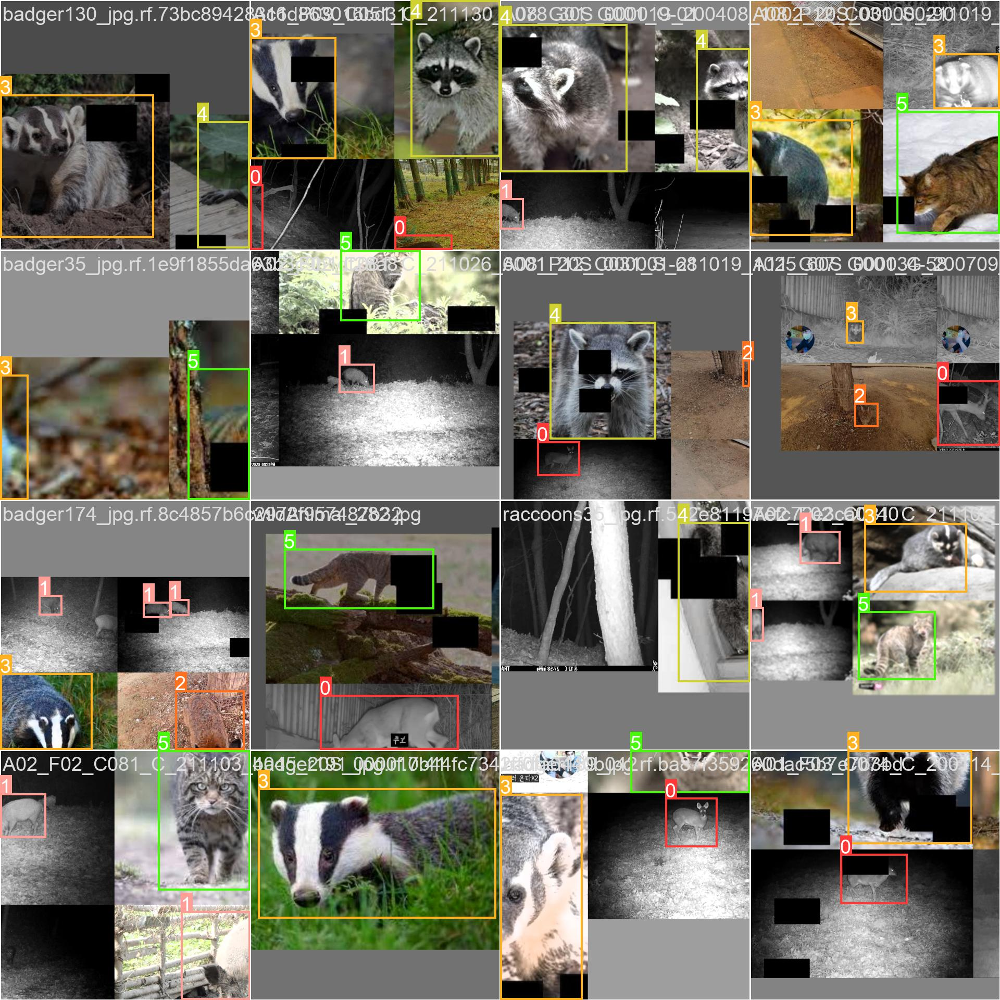

In [ ]:
# 훈련 이미지 시각화

Image(filename='/content/yolov5/runs/train/wildanimal_result/train_batch0.jpg', width=800)

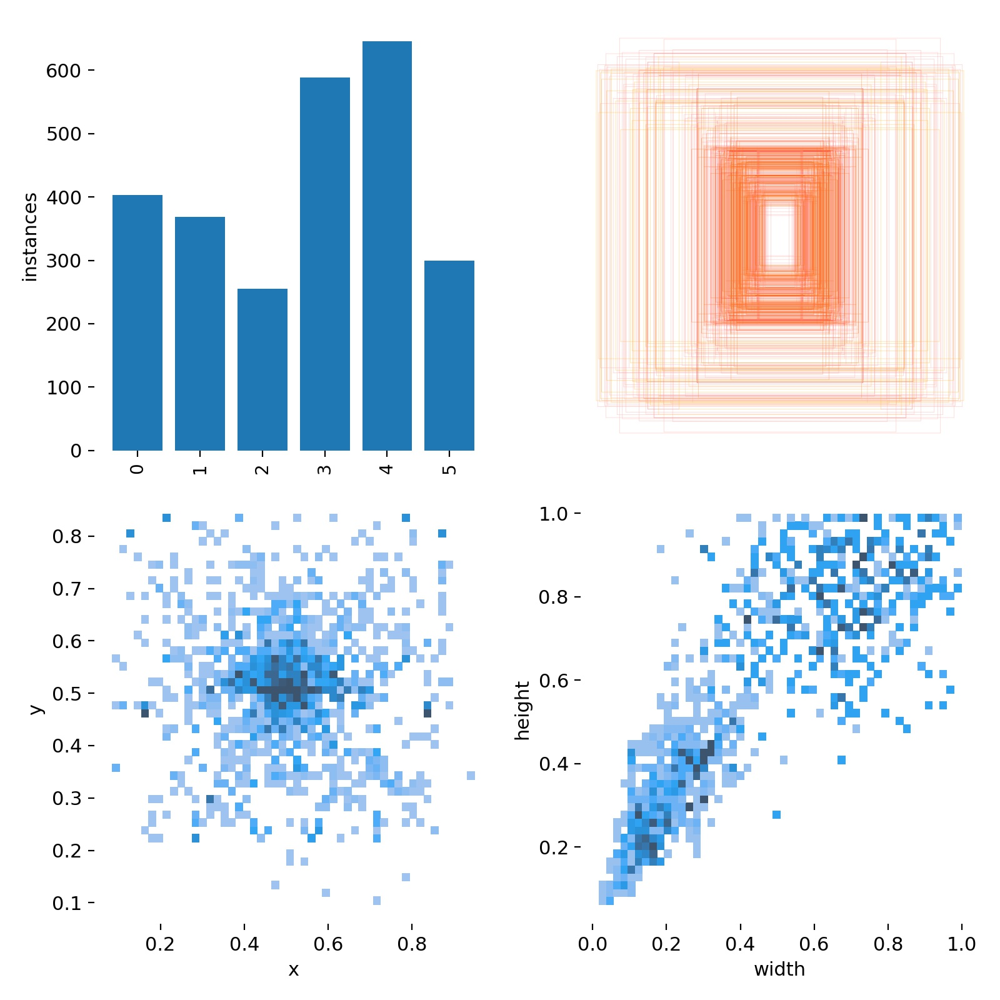

In [ ]:
# 라벨 데이터 개수
# 0 : elk
# 1 : wild boar
# 2 : rabbit
# 3 : badger
# 4 : Raccoons
# 5 : cat

Image(filename='/content/yolov5/runs/train/wildanimal_result/labels.jpg', width=800)

In [ ]:
# 가중치 저장 파일 확인

!ls /content/yolov5/runs/train/wildanimal_result/weights

best.pt  last.pt


In [ ]:
# 가중치 드라이브에 복사

%cp /content/yolov5/runs/train/wildanimal_result/weights/best.pt /content/dirve/MyDrive

# 이미지 파일 추론

In [ ]:
# 이미지 파일 추론

!python detect.py --weights /content/yolov5/runs/train/wildanimal_result/weights/best.pt --img 640 --conf 0.4 --source /content/dirve/MyDrive/wildAni_test

detect: weights=['/content/yolov5/runs/train/wildanimal_result/weights/best.pt'], source=/content/dirve/MyDrive/wildAni_test, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-96-g5a134e0 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 213 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
image 1/23 /content/dirve/MyDrive/wildAni_test/badger1.jpg: 448x640 1 badger, 14.8ms
image 2/23 /content/dirve/MyDrive/wildAni_test/badger2.jpg: 384x640 1 badger, 12.4ms
image 3/23 /content/dirve/MyDrive/wildAni_test/badger3.jpg: 416x640 1 badger, 12.7ms
image 4/23 /content/dirve/MyDrive/wild

['/content/yolov5/runs/detect/exp/badger3.jpg', '/content/yolov5/runs/detect/exp/elk1.jpg', '/content/yolov5/runs/detect/exp/raccoons3.jpg', '/content/yolov5/runs/detect/exp/cat4.jpg', '/content/yolov5/runs/detect/exp/wildboar3.jpg', '/content/yolov5/runs/detect/exp/rabbit1.jpg', '/content/yolov5/runs/detect/exp/wildboar2.jpg', '/content/yolov5/runs/detect/exp/elk4.jpg', '/content/yolov5/runs/detect/exp/raccoons1.jpg', '/content/yolov5/runs/detect/exp/wildboar.jpg', '/content/yolov5/runs/detect/exp/cat3.jpg', '/content/yolov5/runs/detect/exp/elk5.jpg', '/content/yolov5/runs/detect/exp/badger1.jpg', '/content/yolov5/runs/detect/exp/cat1.jpg', '/content/yolov5/runs/detect/exp/rabbit2.jpg', '/content/yolov5/runs/detect/exp/elk2.jpg', '/content/yolov5/runs/detect/exp/badger2.jpg', '/content/yolov5/runs/detect/exp/raccoons2.jpg', '/content/yolov5/runs/detect/exp/cat2.jpg', '/content/yolov5/runs/detect/exp/elk3.jpg', '/content/yolov5/runs/detect/exp/wildboar1.jpg', '/content/yolov5/runs/dete

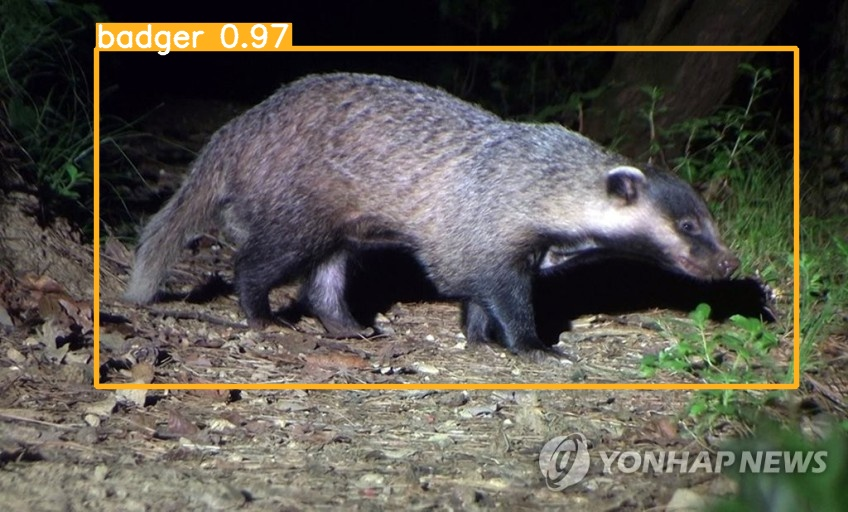

In [ ]:
# 시각화 하여 확인

img = glob('/content/yolov5/runs/detect/exp/*.jpg')
print(img)

# 오소리
Image(filename=img[0], width=550)

In [ ]:
# 이미지 추론한 데이터 드라이브에 저장

%cp -r /content/yolov5/runs/detect/exp /content/dirve/MyDrive

# 영상 파일 추론

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/wildanimal_result/weights/best.pt --img 640 --conf 0.4 --source /content/dirve/MyDrive/test1.mp4

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
video 1/1 (1345/6342) /content/dirve/MyDrive/test1.mp4: 384x640 1 wild boar, 8.6ms
video 1/1 (1346/6342) /content/dirve/MyDrive/test1.mp4: 384x640 1 wild boar, 8.6ms
video 1/1 (1347/6342) /content/dirve/MyDrive/test1.mp4: 384x640 1 wild boar, 8.7ms
video 1/1 (1348/6342) /content/dirve/MyDrive/test1.mp4: 384x640 1 wild boar, 8.8ms
video 1/1 (1349/6342) /content/dirve/MyDrive/test1.mp4: 384x640 1 wild boar, 10.2ms
video 1/1 (1350/6342) /content/dirve/MyDrive/test1.mp4: 384x640 1 wild boar, 11.2ms
video 1/1 (1351/6342) /content/dirve/MyDrive/test1.mp4: 384x640 1 wild boar, 10.1ms
video 1/1 (1352/6342) /content/dirve/MyDrive/test1.mp4: 384x640 1 wild boar, 9.9ms
video 1/1 (1353/6342) /content/dirve/MyDrive/test1.mp4: 384x640 1 wild boar, 8.7ms
video 1/1 (1354/6342) /content/dirve/MyDrive/test1.mp4: 384x640 1 wild boar, 8.7ms
video 1/1 (1355/6342) /content/dirve/MyDrive/test1.mp4: 384x640 1 wild boar, 8.7ms
video 1/1 (1356/6342) /content/dirve/MyDrive/tes

In [ ]:
# 영상 추론한 데이터 드라이브에 저장

%cp -r /content/yolov5/runs/detect/exp2 /content/dirve/MyDrive

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/wildanimal_result/weights/best.pt --img 640 --conf 0.4 --source /content/dirve/MyDrive/wildAnimal_pre.mp4

detect: weights=['/content/yolov5/runs/train/wildanimal_result/weights/best.pt'], source=/content/dirve/MyDrive/wildAnimal_pre.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-96-g5a134e0 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 213 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/926) /content/dirve/MyDrive/wildAnimal_pre.mp4: 384x640 (no detections), 12.8ms
video 1/1 (2/926) /content/dirve/MyDrive/wildAnimal_pre.mp4: 384x640 (no detections), 8.7ms
video 1/1 (3/926) /content/dirve/MyDrive/wildAnimal_pre.mp4: 384x640 (no detections), 11.7ms
video 1/1

In [ ]:
%cp -r /content/yolov5/runs/detect/exp3 /content/dirve/MyDrive/Final

In [ ]:
!python detect.py --weights /content/dirve/MyDrive/Final/best.pt --img 640 --conf 0.4 --source /content/dirve/MyDrive/테스트영상2.mp4

detect: weights=['/content/dirve/MyDrive/Final/best.pt'], source=/content/dirve/MyDrive/테스트영상2.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-97-g903b239 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
custom_YOLOv5s summary: 213 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/4863) /content/dirve/MyDrive/테스트영상2.mp4: 384x640 (no detections), 10.9ms
video 1/1 (2/4863) /content/dirve/MyDrive/테스트영상2.mp4: 384x640 (no detections), 10.2ms
video 1/1 (3/4863) /content/dirve/MyDrive/테스트영상2.mp4: 384x640 (no detections), 10.4ms
video 1/1 (4/4863) /c

In [ ]:
!python detect.py --weights /content/dirve/MyDrive/Final/best.pt --img 640 --conf 0.4 --source /content/dirve/MyDrive/_길고양이처럼_길너구리될수도_…도심_출몰_너구리_많아진_이유____연합뉴스__Yonhapnews__AdobeExpress.mp4

detect: weights=['/content/dirve/MyDrive/Final/best.pt'], source=/content/dirve/MyDrive/_길고양이처럼_길너구리될수도_…도심_출몰_너구리_많아진_이유____연합뉴스__Yonhapnews__AdobeExpress.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-97-g903b239 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
custom_YOLOv5s summary: 213 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/351) /content/dirve/MyDrive/_길고양이처럼_길너구리될수도_…도심_출몰_너구리_많아진_이유____연합뉴스__Yonhapnews__AdobeExpress.mp4: 384x640 (no detections), 10.5ms
video 1/1 (2/351) 

In [ ]:
!python detect.py --weights /content/dirve/MyDrive/Final/best.pt --img 640 --conf 0.4 --source /content/dirve/MyDrive/아기토기_rabbit__7마리_땅속에서_밖으로_나왔더니_경계를_많이_합니다_AdobeExpress.mp4

detect: weights=['/content/dirve/MyDrive/Final/best.pt'], source=/content/dirve/MyDrive/아기토기_rabbit__7마리_땅속에서_밖으로_나왔더니_경계를_많이_합니다_AdobeExpress.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-97-g903b239 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
custom_YOLOv5s summary: 213 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/1225) /content/dirve/MyDrive/아기토기_rabbit__7마리_땅속에서_밖으로_나왔더니_경계를_많이_합니다_AdobeExpress.mp4: 384x640 (no detections), 18.4ms
video 1/1 (2/1225) /content/dirve/MyDrive/아기토기_rabbit__

In [ ]:
!python detect.py --weights /content/dirve/MyDrive/Final/best.pt --img 640 --conf 0.4 --source /content/dirve/MyDrive/wildanimal.mp4

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
video 1/1 (390/5387) /content/dirve/MyDrive/wildanimal.mp4: 384x640 1 Raccoons, 8.6ms
video 1/1 (391/5387) /content/dirve/MyDrive/wildanimal.mp4: 384x640 1 Raccoons, 7.1ms
video 1/1 (392/5387) /content/dirve/MyDrive/wildanimal.mp4: 384x640 1 Raccoons, 7.0ms
video 1/1 (393/5387) /content/dirve/MyDrive/wildanimal.mp4: 384x640 1 Raccoons, 6.9ms
video 1/1 (394/5387) /content/dirve/MyDrive/wildanimal.mp4: 384x640 1 Raccoons, 7.5ms
video 1/1 (395/5387) /content/dirve/MyDrive/wildanimal.mp4: 384x640 1 Raccoons, 7.0ms
video 1/1 (396/5387) /content/dirve/MyDrive/wildanimal.mp4: 384x640 1 Raccoons, 7.1ms
video 1/1 (397/5387) /content/dirve/MyDrive/wildanimal.mp4: 384x640 1 Raccoons, 7.8ms
video 1/1 (398/5387) /content/dirve/MyDrive/wildanimal.mp4: 384x640 1 Raccoons, 7.4ms
video 1/1 (399/5387) /content/dirve/MyDrive/wildanimal.mp4: 384x640 1 Raccoons, 7.0ms
video 1/1 (400/5387) /content/dirve/MyDrive/wildanimal.mp4: 384x640 1 Raccoons, 6.9ms
video 1/1 (401/538

In [ ]:
%cp -r /content/yolov5/runs/detect/exp6 /content/dirve/MyDrive/Final

In [ ]:
%cp -r /content/yolov5/runs/detect/exp4 /content/dirve/MyDrive/Final

In [ ]:
%cp -r /content/yolov5/runs/detect/exp2 /content/dirve/MyDrive/Final

In [ ]:
!python detect.py --weights /content/dirve/MyDrive/Final/best.pt --img 640 --conf 0.4 --source /content/dirve/MyDrive/Final/고양이가_자연생태계에_끼치는_심각한_영향____1년에_24억_킬_AdobeExpress.mp4

detect: weights=['/content/dirve/MyDrive/Final/best.pt'], source=/content/dirve/MyDrive/Final/고양이가_자연생태계에_끼치는_심각한_영향____1년에_24억_킬_AdobeExpress.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-97-g903b239 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
custom_YOLOv5s summary: 213 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/1860) /content/dirve/MyDrive/Final/고양이가_자연생태계에_끼치는_심각한_영향____1년에_24억_킬_AdobeExpress.mp4: 384x640 (no detections), 15.1ms
video 1/1 (2/1860) /content/dirve/MyDrive/Final/고양이가

In [ ]:
%cp -r /content/yolov5/runs/detect/exp7 /content/dirve/MyDrive/Final

# Github 연동

In [ ]:
%cd /content/dirve/MyDrive/Final

/content/dirve/MyDrive/Final


In [ ]:
!echo "Detected Animals Project" >> README.md
!git init
!git config --global user.email "https://github.com/hwanggiju/"
!git config --global user.name "HwangGiJu"
!git add README.md
!git commit -m "first commit"
!git branch -M main
!git remote add origin https://github.com/hwanggiju/Detect_WildAnimals.git
!git push -u origin main

Reinitialized existing Git repository in /content/dirve/MyDrive/Final/.git/
[main 638b6e3] first commit
 1 file changed, 1 insertion(+)
fatal: could not read Username for 'https://github.com': No such device or address


In [ ]:
!git remote rm origin